In [1]:
import torch
import csv,re, time
import pickle
import random
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
from scipy import stats
from scipy.sparse import issparse
import scanpy as sc
import matplotlib.colors as clr
import matplotlib.pyplot as plt
import cv2
import TESLA as tesla
from IPython.display import Image
import scipy.sparse
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scanpy import read_10x_h5
import PIL
from PIL import Image as IMAGE
import os
import METI as meti
import tifffile as tiff
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap
from scipy.ndimage import gaussian_filter
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [8]:
import importlib
import METI as meti
importlib.reload(meti)

<module 'METI' from '/home/jjiang6/.local/lib/python3.10/site-packages/METI/__init__.py'>

**1. Quality Control**

In [2]:
adata=sc.read_visium("/rsrch4/scratch/genomic_med/jjiang6/Project1/data/S1_54078/Spaceranger/")
spatial=pd.read_csv("/rsrch4/scratch/genomic_med/jjiang6/Project1/data/S1_54078/Spaceranger/tissue_positions_list.csv",sep=",",header=None,na_filter=False,index_col=0)
adata.obs["x1"]=spatial[1]
adata.obs["x2"]=spatial[2]
adata.obs["x3"]=spatial[3]
adata.obs["x4"]=spatial[4]
adata.obs["x5"]=spatial[5] 
adata.obs["array_x"]=adata.obs["x2"]
adata.obs["array_y"]=adata.obs["x3"]
adata.obs["pixel_x"]=adata.obs["x4"]
adata.obs["pixel_y"]=adata.obs["x5"]

adata

AnnData object with n_obs × n_vars = 1202 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'x1', 'x2', 'x3', 'x4', 'x5', 'array_x', 'array_y', 'pixel_x', 'pixel_y'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

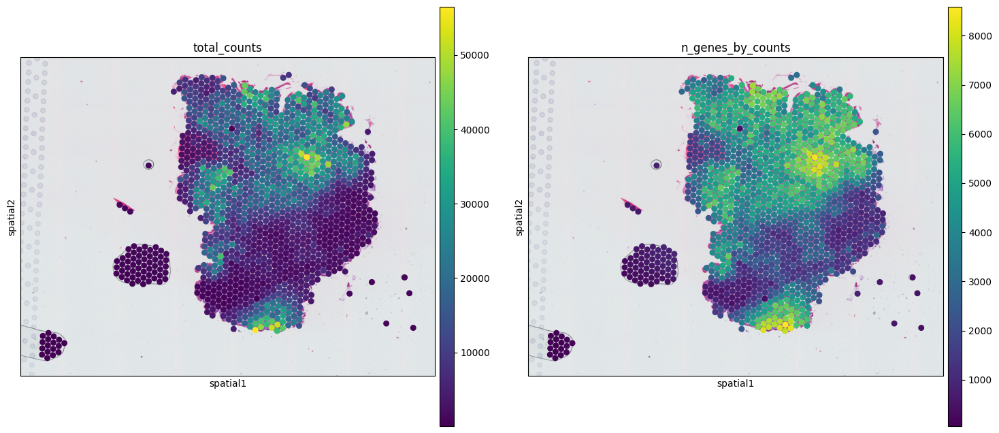

In [3]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"], size = 1.5, save = 'UMI_count.png')

**2. Read in data**

In [4]:
adata=adata[adata.obs["x1"]==1]
adata.var_names=[i.upper() for i in list(adata.var_names)]
adata.var["genename"]=adata.var.index.astype("str")
# adata.write_h5ad("/rsrch4/scratch/genomic_med/jjiang6/Project1/result/S1_54078/S1_54078_data.h5ad")
counts=adata.copy()

# HE image
PIL.Image.MAX_IMAGE_PIXELS = None
img = IMAGE.open(r"/rsrch4/scratch/genomic_med/jjiang6/Project1/data/S1_54078/1415785-6 Bx2.tif") 
img = np.array(img)

#if your image has 4 dimensions, only keep first 3 dims
print(img.shape)
img=img[...,:3]

(9343, 9438, 3)


**3. Gene expression enhancement**

**3.1 Preprocessing**

In [5]:
resize_factor=1000/np.min(img.shape[0:2])
resize_width=int(img.shape[1]*resize_factor)
resize_height=int(img.shape[0]*resize_factor)
counts.var.index=[i.upper() for i in counts.var.index]
counts.var_names_make_unique()
counts.raw=counts
sc.pp.log1p(counts) # impute on log scale
if issparse(counts.X):counts.X=counts.X.A

**3.2 Contour detection**

In [6]:
cnt=tesla.cv2_detect_contour(img, apertureSize=5,L2gradient = True)
binary=np.zeros((img.shape[0:2]), dtype=np.uint8)
cv2.drawContours(binary, [cnt], -1, (1), thickness=-1)
cnt_enlarged = tesla.scale_contour(cnt, 1.05)
binary_enlarged = np.zeros(img.shape[0:2])
cv2.drawContours(binary_enlarged, [cnt_enlarged], -1, (1), thickness=-1)

img_new = img.copy()
cv2.drawContours(img_new, [cnt], -1, (255), thickness=20)
img_new=cv2.resize(img_new, ((resize_width, resize_height)))

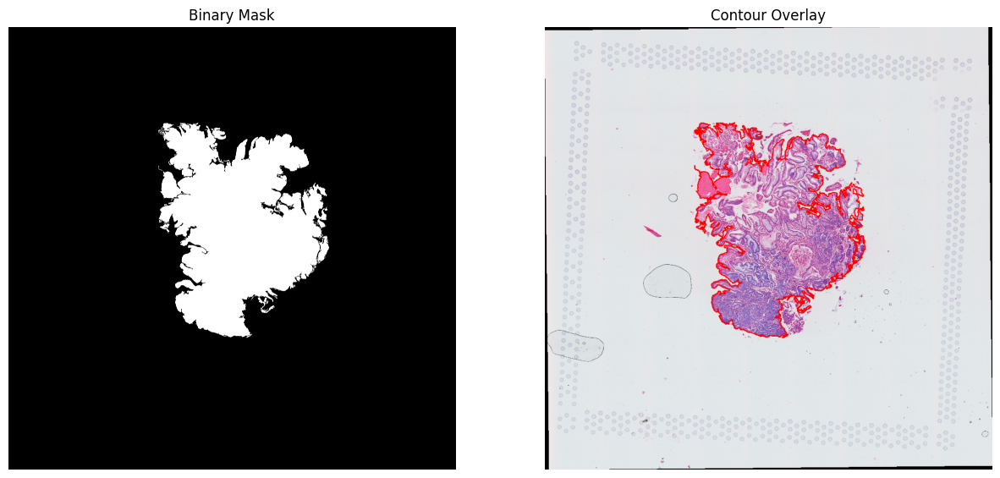

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10))

# Display binary image (black and white mask)
axes[0].imshow(binary, cmap='gray')
axes[0].set_title("Binary Mask")
axes[0].axis("off")

axes[1].imshow(img_new)
axes[1].set_title("Contour Overlay")
axes[1].axis("off")

plt.show()

**3.3 Gene expression enhancement**

In [8]:
#Set size of superpixel
res=50
# Note, if the numer of superpixels is too large and take too long, you can increase the res to 100
enhanced_exp_adata=tesla.imputation(img=img, raw=counts, cnt=cnt, genes=counts.var.index.tolist(), shape="None", res=res, s=1, k=2, num_nbs=10)
# enhanced_exp_adata.write_h5ad("/rsrch4/scratch/genomic_med/jjiang6/Project1/result/S1_54078/enhanced_exp.h5ad")

Total number of sudo points:  4513
Calculating spot 0
Calculating spot 1000
Calculating spot 2000
Calculating spot 3000
Calculating spot 4000
--- 21.762351989746094 seconds ---
Imputing spot 0
Imputing spot 1000
Imputing spot 2000
Imputing spot 3000
Imputing spot 4000


**4. Goblet marker gene expression**

In [9]:
#================ determine if markers are in ===============#
enhanced_exp_adata=sc.read("/rsrch4/scratch/genomic_med/jjiang6/Project1/result/S1_54078/enhanced_exp.h5ad")
markers = ["MS4A10", "MGAM", "CYP4F2", "XPNPEP2", "SLC5A9", "SLC13A2", "SLC28A1", "MEP1A", "ABCG2", "ACE2"]
for i in range(len(markers)):
    if markers[i] in enhanced_exp_adata.var.index: print("yes")
    else: print(markers[i])

yes
yes
yes
yes
yes
yes
yes
yes
yes
yes


In [10]:
save_dir="/rsrch4/scratch/genomic_med/jjiang6/Project1/result/S1_54078/Goblet/"
if not os.path.exists(save_dir):os.mkdir(save_dir)

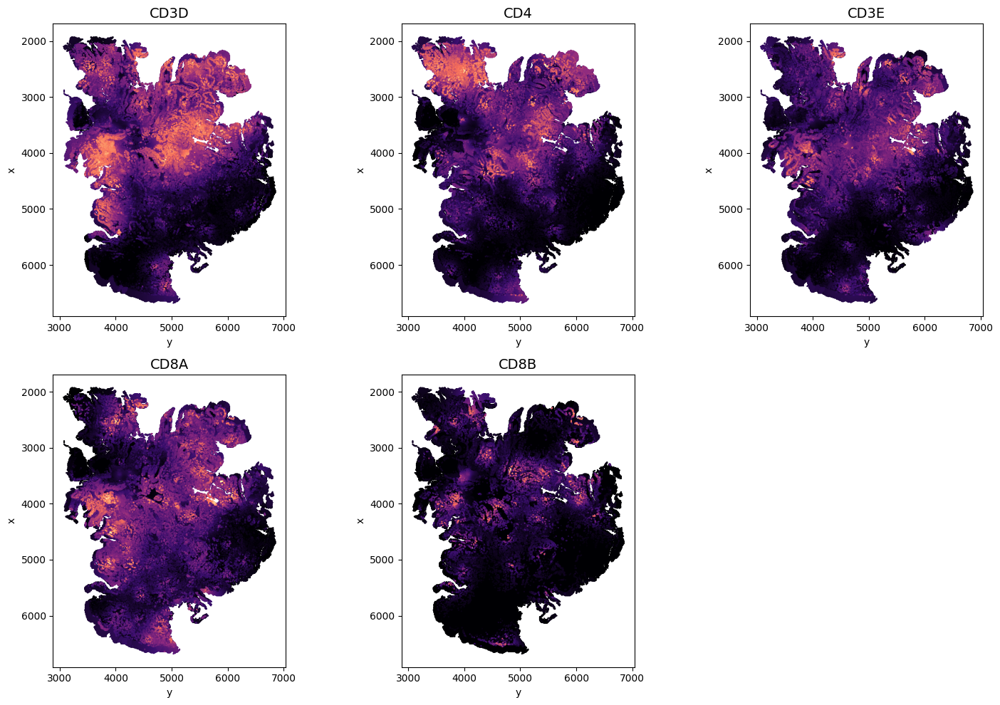

In [12]:
#================ Plot gene expression image ===============#
markers = ["CD3D", "CD4", "CD3E", "CD8A", "CD8B"]
n_cols = 3
n_rows = int(np.ceil(len(markers) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, g in enumerate(markers):
    cnt_color = clr.LinearSegmentedColormap.from_list('magma', 
                ["#000003",  "#3b0f6f",  "#8c2980", "#f66e5b", "#fd9f6c", "#fbfcbf"], N=256)
    enhanced_exp_adata.obs[g] = enhanced_exp_adata.X[:, enhanced_exp_adata.var.index == g]
    sc.pl.scatter(enhanced_exp_adata, alpha=1, x="y", y="x", color=g, 
                  color_map=cnt_color, show=False, size=10, ax=axes[i])
    
    if axes[i].collections:  # Check if colorbar exists
        cbar = axes[i].collections[0].colorbar  # Access colorbar
        if cbar is not None:
            cbar.remove()
            
    axes[i].set_aspect('equal', 'box')
    axes[i].invert_yaxis()
    axes[i].set_title(g, fontsize=14)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


Computing image band...
Computing gene band...


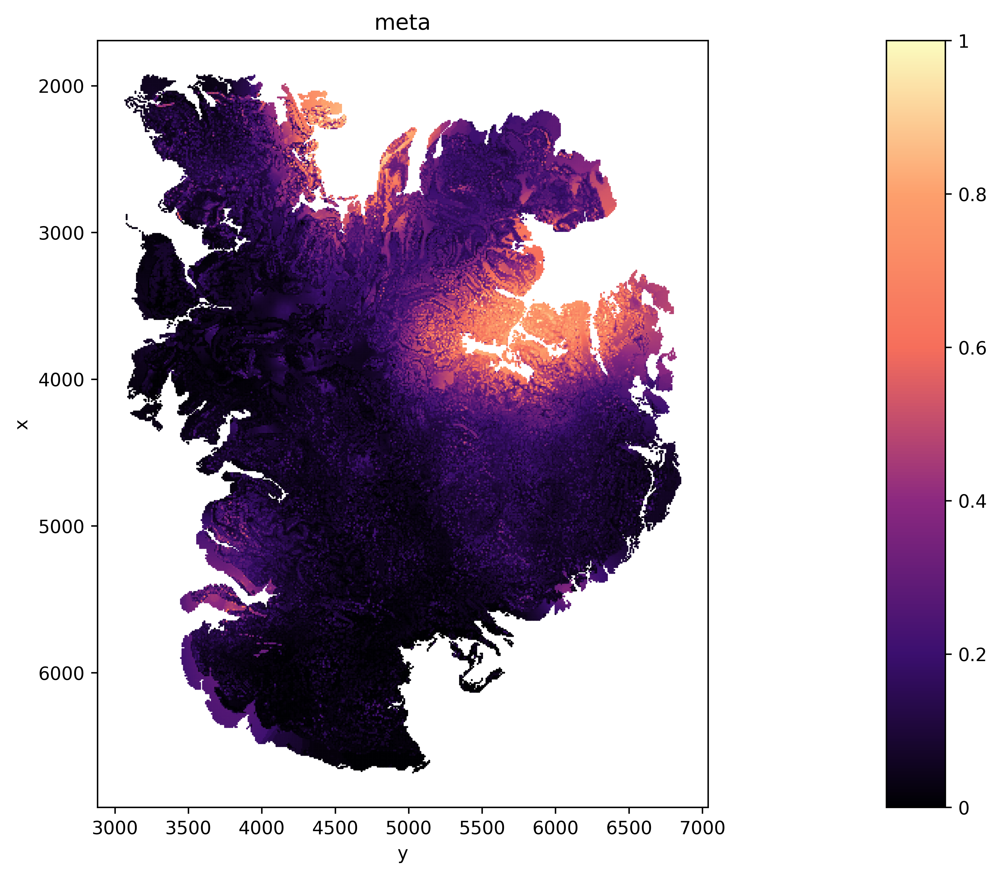

In [13]:
#================ Plot meta gene expression image ===============#
genes =   ["MS4A10", "MGAM", "CYP4F2", "XPNPEP2", "SLC5A9", "SLC13A2", "SLC28A1", "MEP1A", "ABCG2", "ACE2"]
    
sudo_adata = meti.meta_gene_plot(img=img, 
                                binary=binary,
                                sudo_adata=enhanced_exp_adata, 
                                genes=genes, 
                                resize_factor=resize_factor,
                                target_size="small")

cnt_color = clr.LinearSegmentedColormap.from_list('magma', ["#000003",  "#3b0f6f",  "#8c2980",   "#f66e5b", "#fd9f6c", "#fbfcbf"], N=256)
fig=sc.pl.scatter(sudo_adata,alpha=1,x="y",y="x",color='meta',color_map=cnt_color,show=False,size=5)
fig.set_aspect('equal', 'box')
fig.invert_yaxis()
plt.gcf().set_dpi(600)
plt.show()

**5. Region annotation**

In [14]:
pred_refined, target_clusters, c_m=meti.annotation(img=img, 
                                                    binary=binary,
                                                    sudo_adata=enhanced_exp_adata, 
                                                    genes=genes, 
                                                    resize_factor=resize_factor,
                                                    num_required=1, 
                                                    target_size="large")

ret_img=tesla.visualize_annotation(img=img, 
                              binary=binary, 
                              resize_factor=resize_factor,
                              pred_refined=pred_refined, 
                              target_clusters=target_clusters, 
                              c_m=c_m)

Computing image band...
Computing gene band...
Running TESLA...
0 / 30 |  label num : 99 |  main clusters : 54  | feature loss : 4.0262770652771  | spatial loss : 2.0743823051452637
--- 40.24392223358154 seconds ---
1 / 30 |  label num : 90 |  main clusters : 33  | feature loss : 3.979003667831421  | spatial loss : 0.6247724294662476
--- 73.3593578338623 seconds ---
2 / 30 |  label num : 72 |  main clusters : 24  | feature loss : 3.8605141639709473  | spatial loss : 0.28150683641433716
--- 93.71575808525085 seconds ---
mainLabels 24 reached minLabels 30 .
Finding target clusters...
c_m:
[(10, 0.6393552278697925), (12, 0.5114069501971947), (6, 0.2995107858436492), (4, 0.2937514504976678), (11, 0.17714684660494898), (7, 0.1500874717205531), (14, 0.14879049524077223), (15, 0.14190794674964158), (13, 0.12007715186919288), (5, 0.09988515634354585), (2, 0.09062924348571458), (9, 0.06273324650248349), (1, 0.043992836199464536), (3, 0.027885739458706576), (0, 0.0), (8, 0.0)]
Target clusters:
[

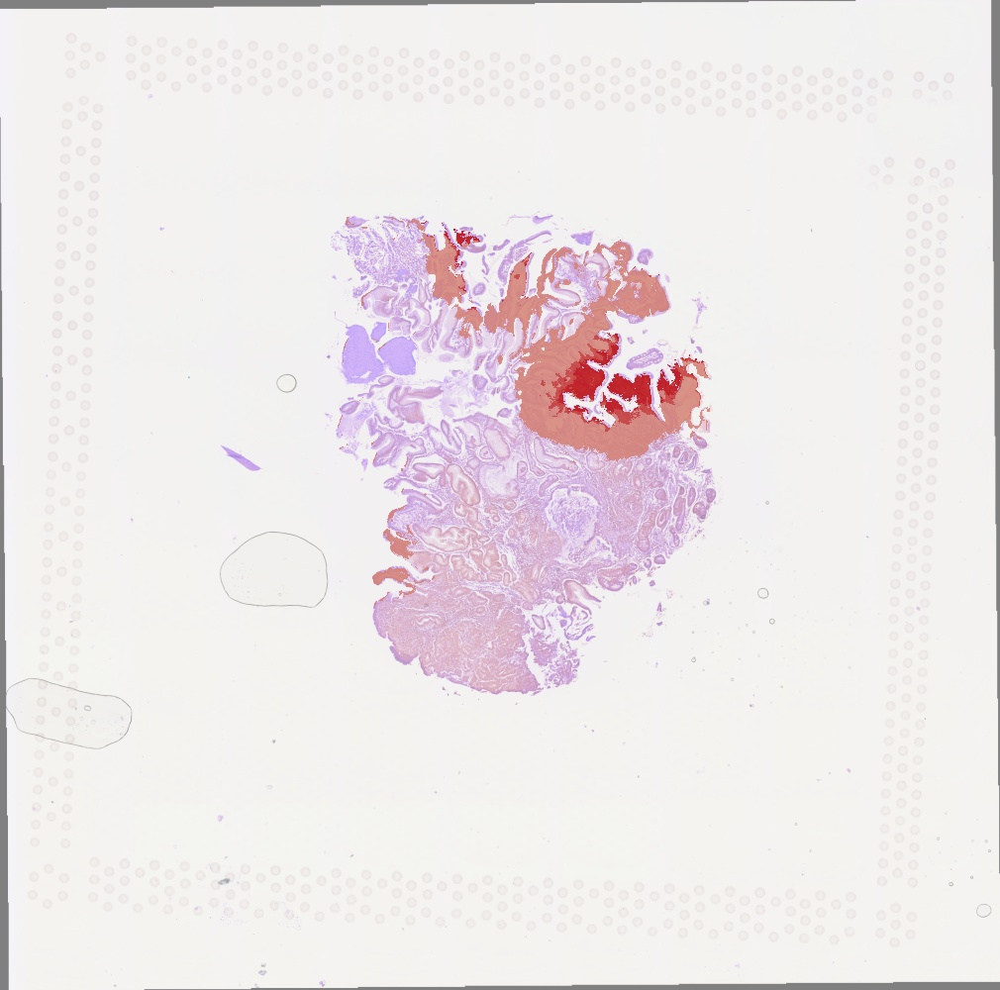

In [15]:
cv2.imwrite(save_dir + 'Goblet_anno.jpg', ret_img)
Image(filename=save_dir + 'Goblet_anno.jpg')

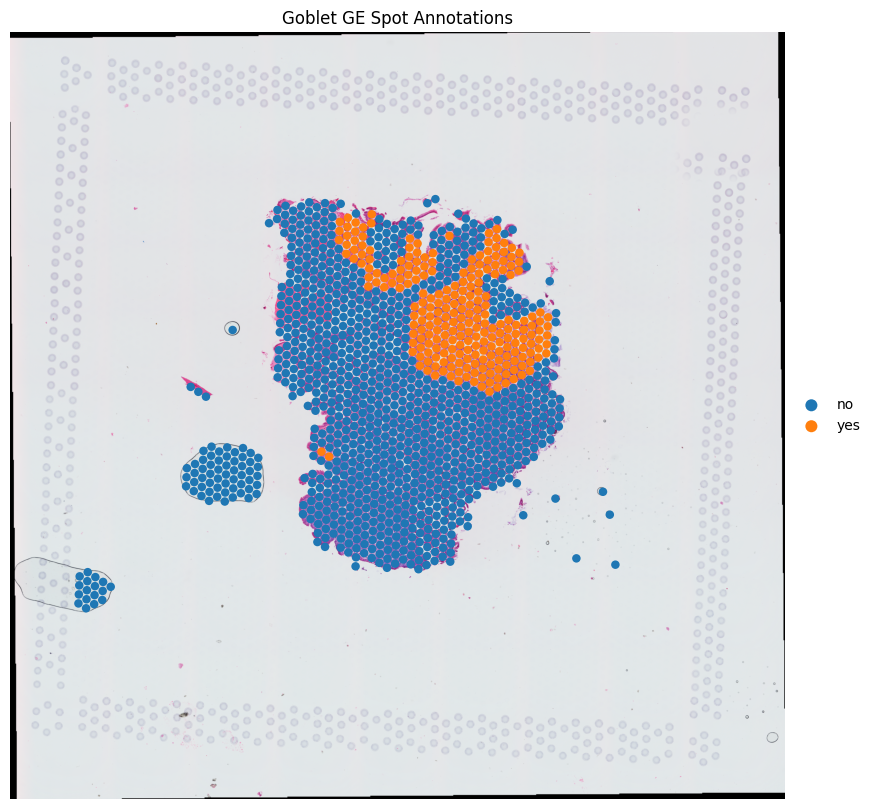

In [27]:
#=====================================Convert to spot level============================================#
adata.obs["color"]=meti.extract_color(x_pixel=(np.array(adata.obs["pixel_x"])*resize_factor).astype(np.int64), 
                                 y_pixel=(np.array(adata.obs["pixel_y"])*resize_factor).astype(np.int64), image=ret_img.copy(), beta=25)

type = []
for each in adata.obs["color"]:
    if each < adata.obs["color"].quantile(0.20):
        r = "yes"
        type.append(r)
    else:
        r = "no"
        type.append(r)

adata.obs['Goblet_GE'] = type

fig, ax = plt.subplots(figsize=(10, 10))  # Adjust the size as needed
ax.imshow(img)
ax.set_axis_off()
sc.pl.scatter(adata, x='pixel_y', y='pixel_x', color='Goblet_GE', ax=ax, size = 150, title='Goblet GE Spot Annotations')
plt.show()

**7. Segmentation**

In [17]:
plot_dir="/rsrch4/scratch/genomic_med/jjiang6/Project1/result/S1_54078/Segmentation/"
adata= sc.read("/rsrch4/scratch/genomic_med/jjiang6/Project1/result/S1_54078/S1_54078_data.h5ad")

img_path = '/rsrch4/scratch/genomic_med/jjiang6/Project1/data/S1_54078/1415785-6 Bx2.tif'
img = tiff.imread(img_path)
d0, d1= img.shape[0], img.shape[1]

#=====================================Split into patched=====================================================
patch_size=400
patches=meti.patch_split_for_ST(img=img, patch_size=patch_size, spot_info=adata.obs, x_name="pixel_x", y_name="pixel_y")
patch_info=adata.obs

# # save results
# pickle.dump(patches, open(plot_dir + 'patches.pkl', 'wb'))

In [20]:
#=================================Image Segmentation===================================
save_dir = '/rsrch4/scratch/genomic_med/jjiang6/Project1/result/S1_54078/Segmentation/'
meti.Segment_Patches(patches, save_dir=save_dir,n_clusters=10)

In [21]:
#=================================Get masks=================================#
pred_file_locs=[save_dir+"/patch"+str(j)+"_pred.npy" for j in range(patch_info.shape[0])]
dic_list=meti.get_color_dic(patches, seg_dir=save_dir)
masks_index=meti.Match_Masks(dic_list, num_mask_each=10, mapping_threshold1=30, mapping_threshold2=60)

masks=meti.Extract_Masks(masks_index, pred_file_locs, patch_size)
combined_masks=meti.Combine_Masks(masks, patch_info, d0, d1)

#=================================Plot masks=================================#
plot_dir = '/rsrch4/scratch/genomic_med/jjiang6/Project1/result/S1_54078/Segmentation/mask/'

for i in range(masks.shape[0]): #Each mask
	print("Plotting mask ", str(i))
	ret=(combined_masks[i]*255)
	cv2.imwrite(plot_dir+'/mask'+str(i)+'.png', ret.astype(np.uint8))

Doing  0
Adding,  no match counts: 0 new rate: 1.0
Not adding,  no match counts: 0 new rate: 0.7744874715261959
Adding,  no match counts: 0 new rate: 0.9587628865979382
Adding,  no match counts: 209 new rate: 0.9555345316934721
Doing  1
Not adding,  no match counts: 0 new rate: 0.38466947960618847
Not adding,  no match counts: 34 new rate: 0.7984819734345351
Not adding,  no match counts: 1 new rate: 0.6149016324822101
Adding,  no match counts: 46 new rate: 0.9168600154679041
Not adding,  no match counts: 78 new rate: 0.5986685687113646
Adding,  no match counts: 111 new rate: 0.8151191454396056
Doing  2
Not adding,  no match counts: 96 new rate: 0.5178018575851393
Not adding,  no match counts: 78 new rate: 0.6366366366366366
Not adding,  no match counts: 71 new rate: 0.7272122421823021
Not adding,  no match counts: 0 new rate: 0.39351198871650217
Not adding,  no match counts: 0 new rate: 0.49791955617198336
Not adding,  no match counts: 64 new rate: 0.4863701578192252
Doing  3
Not addin

In [22]:
#=================================Choose one mask to detect cells/nucleis=================================#
channel=1
converted_image = combined_masks[1].astype(np.uint8)
ret, labels = cv2.connectedComponents(converted_image)
features=meti.Extract_CC_Features_each_CC(labels)

num_labels = labels.max()
height, width = labels.shape

colors = np.random.randint(0, 255, size=(num_labels + 1, 3), dtype=np.uint8)
colors[0] = [0, 0, 0]
colored_mask = np.zeros((height, width, 3), dtype=np.uint8)
colored_mask = colors[labels]

# save the colored nucleis channel
# cv2.imwrite(plot_dir + 'goblet.png', colored_mask)
# save nucleis label
# np.save(plot_dir + 'labels.npy', labels)
# save nucleis features, including, area, length, width
# features.to_csv(plot_dir + 'features.csv', index=False)

Image(plot_dir + 'goblet.png')

In [23]:
print(features)

         label  area  major_axis_length  minor_axis_length  solidity
0            1  11.0           8.950070           1.998854  0.647059
1            2   6.0           6.110101           2.666667  0.545455
2            3   1.0           0.000000           0.000000  1.000000
3            4  31.0           8.848340           5.917954  0.688889
4            5   1.0           0.000000           0.000000  1.000000
...        ...   ...                ...                ...       ...
112832  112833   1.0           0.000000           0.000000  1.000000
112833  112834   2.0           2.000000           0.000000  1.000000
112834  112835   8.0           4.727145           2.157336  0.888889
112835  112836   1.0           0.000000           0.000000  1.000000
112836  112837   2.0           2.000000           0.000000  1.000000

[112837 rows x 5 columns]


In [24]:
#=================================filter out goblet cells=================================#
labels=np.load(plot_dir+"labels.npy")
features=pd.read_csv(plot_dir+"features.csv", header=0, index_col=0)
features['mm_ratio'] = features['major_axis_length']/features['minor_axis_length']
features_sub=features[(features["area"]>120) &
					  (features["area"]<1500) &
					  (features["solidity"]>0.85) &
					  (features["mm_ratio"]<2)]
index=features_sub.index.tolist()
labels_filtered=labels*np.isin(labels, index)

np.save(plot_dir+"nuclei_filtered.npy", labels_filtered)

num_labels = labels_filtered.max()
height, width = labels_filtered.shape

colors = np.random.randint(0, 255, size=(num_labels + 1, 3), dtype=np.uint8)
colors[0] = [0, 0, 0]
colored_mask = np.zeros((height, width, 3), dtype=np.uint8)
colored_mask = colors[labels_filtered]

# cv2.imwrite(plot_dir+'goblet_filtered.png', colored_mask)

Image(plot_dir + 'goblet_filtered.png')

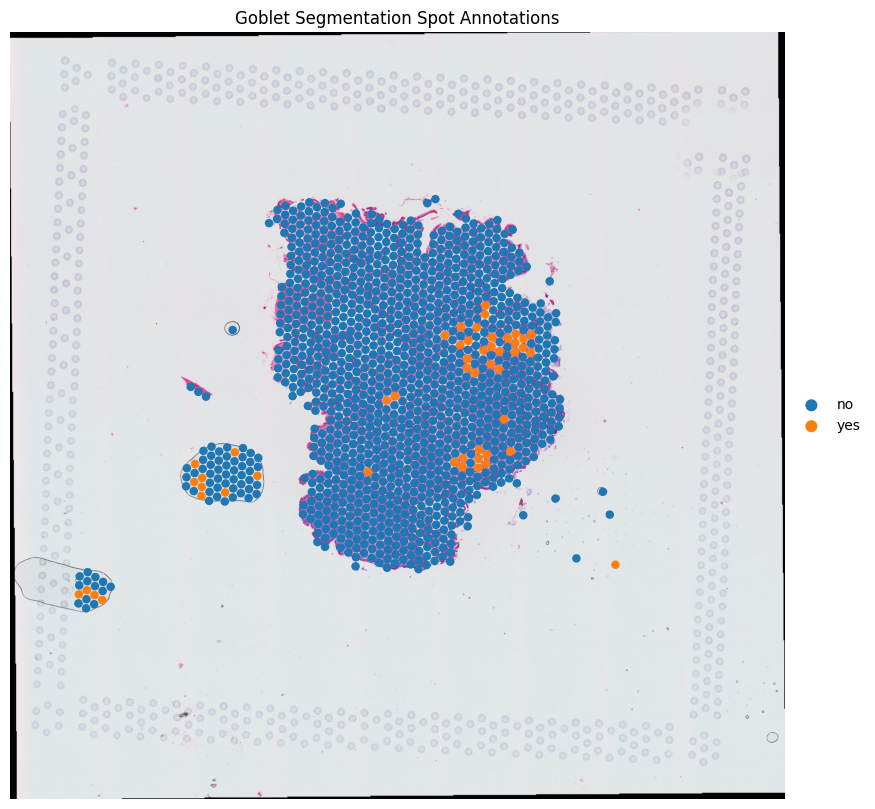

In [25]:
#=====================================Convert to spot level============================================#
img_seg = np.load(plot_dir+'nuclei_filtered_white.npy')

adata.obs["color"]=meti.extract_color(x_pixel=(np.array(adata.obs["pixel_x"])).astype(np.int64), 
                    y_pixel=(np.array(adata.obs["pixel_y"])).astype(np.int64), image=img_seg, beta=49)

type = []
for each in adata.obs["color"]:
    if each > 0:
        r = "yes"
        type.append(r)
    else:
        r = "no"
        type.append(r)

adata.obs['Goblet_seg'] = type

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img)
ax.set_axis_off()
sc.pl.scatter(adata, x='pixel_y', y='pixel_x', color='Goblet_seg', ax=ax, size = 150, title='Goblet Segmentation Spot Annotations')
plt.show()

**8. Integrarion of gene expression result with segmentation result**

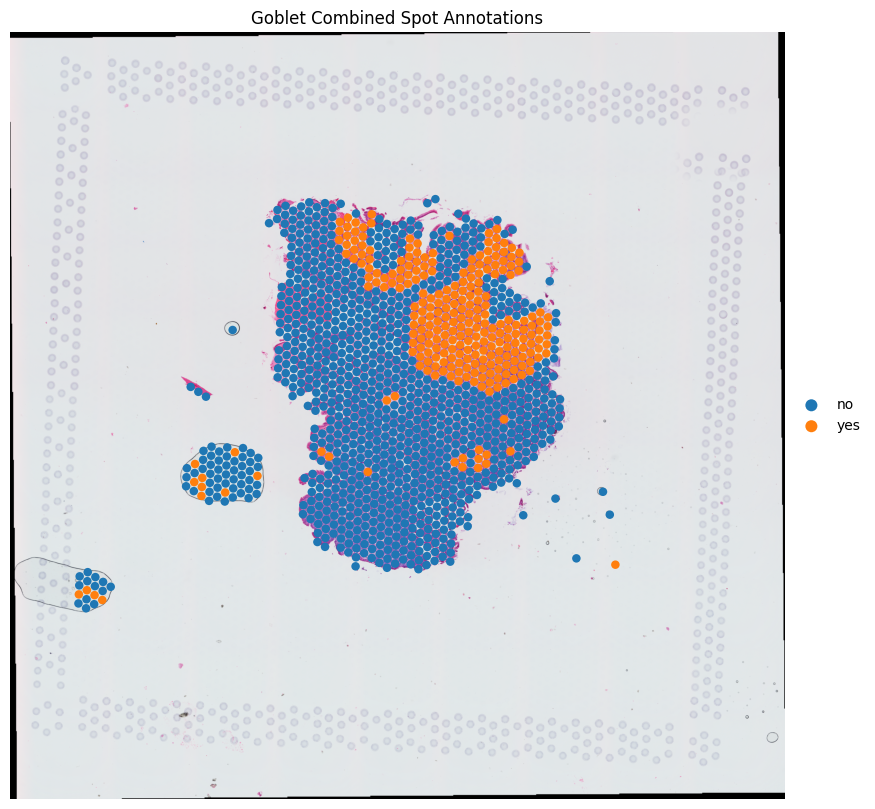

In [28]:
adata.obs['Goblet_combined'] = np.where((adata.obs['Goblet_seg'] == 'yes') | (adata.obs['Goblet_GE'] == 'yes'), 'yes', 'no')

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img)
ax.set_axis_off()
sc.pl.scatter(adata, x='pixel_y', y='pixel_x', color='Goblet_combined', ax=ax, size = 150,title='Goblet Combined Spot Annotations')
plt.show()

**9. Density plot**

**9.1 2D density plot**

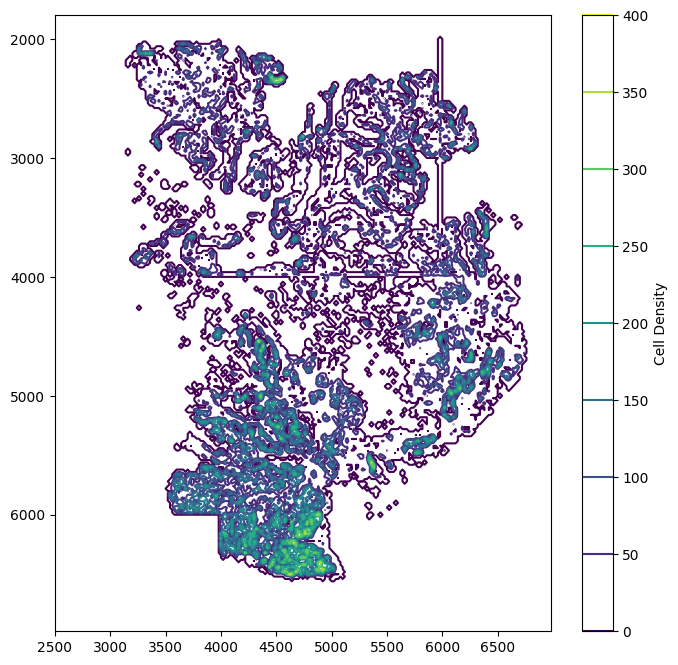

In [31]:
#-----------------------------------Density of nuclei------------------------------------------#
ret=np.load(plot_dir + "cell_nuclei.npy")
step = 20
x_range = np.arange(1800, 7000, step)
y_range = np.arange(2500, 7000, step)

num_cells = np.array([np.sum(ret[x:x+step, y:y+step]) for x in x_range for y in y_range])
rows, cols = len(x_range), len(y_range)
Z = num_cells.reshape(rows, cols)
x_pixel, y_pixel = np.meshgrid(y_range, x_range)

plt.contour(x_pixel, y_pixel, Z)  
plt.colorbar(label="Cell Density")  
plt.gca().invert_yaxis() 
plt.show()

**9.2 3D density plot**

In [32]:
coolwarm_colors = [(0, "#ffffff"), (0.25, "#3c4dc7"), (0.5, "#f5f5f5"), (0.75, "#ff8c00"), (1, "#c72222")]
coolwarm_cmap = LinearSegmentedColormap.from_list('coolwarm', coolwarm_colors)

def plotter(E=30, A=60, save_path=None):
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    smoothed_Z = gaussian_filter(Z, sigma=2)
    im = ax.plot_surface(x_pixel, y_pixel, smoothed_Z, cmap=coolwarm_cmap, alpha=0.85)
    ax.contourf(x_pixel, y_pixel, smoothed_Z, zdir='z', offset=-1500, cmap=coolwarm_cmap)

    ax.view_init(elev=E, azim=A)
    ax.set_zlim([-1500, 1000])
    ax.set_zticks([])
    ax.set_zlabel('')
    fig.colorbar(im, shrink=0.5)
    ax.grid(False)

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

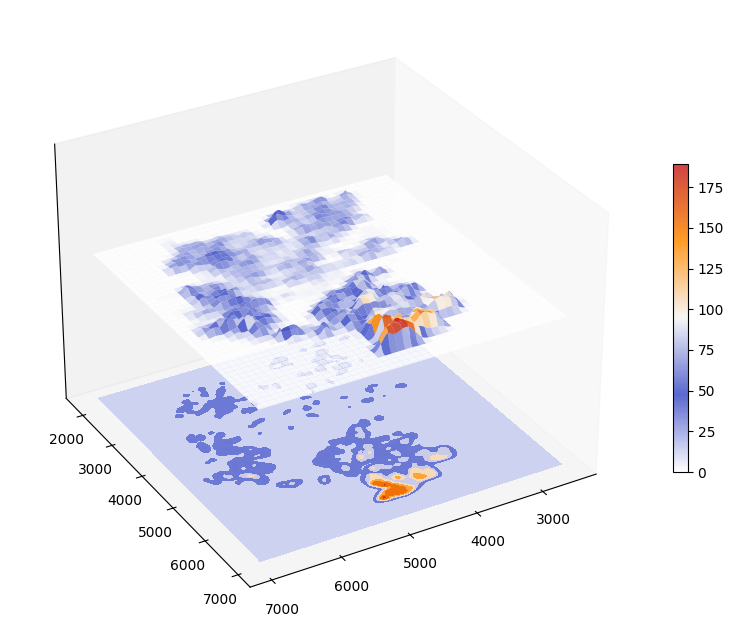

In [33]:
# plotter(E=30, A=60, save_path=plot_dir + '3D_Density.png')
plotter(E=30, A=60)

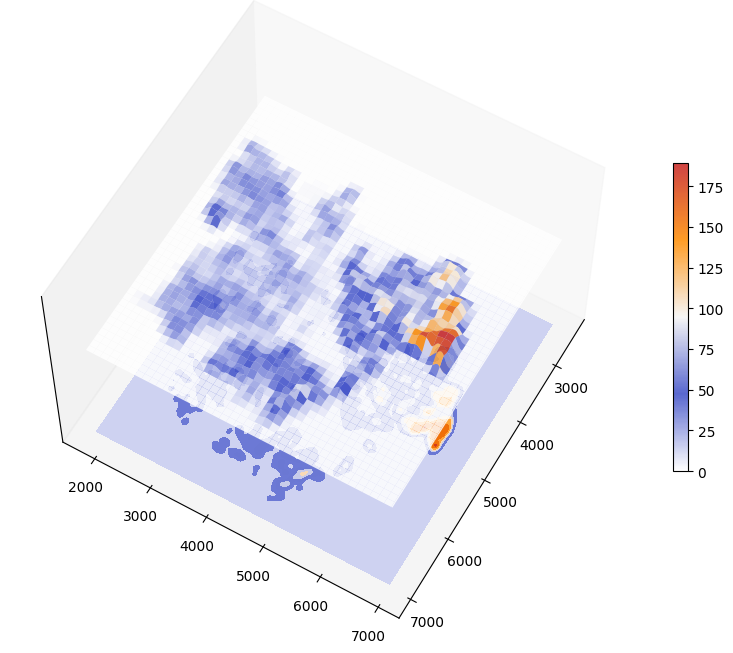

In [34]:
plotter(E=60, A=30)

**10. Cell type identification (T cells as an example)**

In [18]:
#-----------------------------------T cell aggregate------------------------------------------#
save_dir = '/rsrch4/scratch/genomic_med/jjiang6/Project1/result/S1_54078/Tcell/'
genes= ["CD3D", "CD3E"]
genes=list(set([i for i in genes if i in enhanced_exp_adata.var.index ]))
pred_refined, target_clusters, c_m=meti.annotation(img=img, 
                                                    binary=binary,
                                                    sudo_adata=enhanced_exp_adata, 
                                                    genes=genes, 
                                                    resize_factor=resize_factor,
                                                    num_required=1, 
                                                    target_size="small")

#Plot
ret_img=tesla.visualize_annotation(img=img, 
                              binary=binary, 
                              resize_factor=resize_factor,
                              pred_refined=pred_refined, 
                              target_clusters=target_clusters, 
                              c_m=c_m)

cv2.imwrite(save_dir + "CD3D_CD3E.jpg", ret_img)
Image(filename=save_dir + "CD3D_CD3E.jpg")

print("Target_clusters: ", target_clusters, "\n")
T_CD3DE = pred_refined

Computing image band...
Computing gene band...
Running TESLA...
0 / 30 |  label num : 99 |  main clusters : 54  | feature loss : 4.025320053100586  | spatial loss : 2.207420825958252
--- 48.70660066604614 seconds ---
1 / 30 |  label num : 86 |  main clusters : 35  | feature loss : 3.9589247703552246  | spatial loss : 0.6965885162353516
--- 79.44317150115967 seconds ---
2 / 30 |  label num : 69 |  main clusters : 23  | feature loss : 3.8065948486328125  | spatial loss : 0.3411176800727844
--- 102.18082642555237 seconds ---
mainLabels 23 reached minLabels 30 .
Finding target clusters...
c_m:
[(4, 0.4250593474010883), (7, 0.3708548334078047), (9, 0.29450628106989074), (2, 0.24193934898061298), (11, 0.23761676813722546), (8, 0.18726890010134042), (12, 0.14244838700910945), (3, 0.0946316870529674), (10, 0.0626324501415908), (1, 0.04284254405135104), (13, 0.03754210553569904), (5, 0.02687618910729843), (6, 0.018298139953205426), (0, 8.586310542758223e-06)]
Target clusters:
[4, 7]
Target_clus

In [ ]:
#-----------------------------------CD4 expression------------------------------------------#
genes= ["CD4"]
genes=list(set([i for i in genes if i in enhanced_exp_adata.var.index ]))
pred_refined, target_clusters, c_m=meti.annotation(img=img, 
                                                    binary=binary,
                                                    sudo_adata=enhanced_exp_adata, 
                                                    genes=genes, 
                                                    resize_factor=resize_factor,
                                                    num_required=1, 
                                                    target_size="small")

#Plot
ret_img=tesla.visualize_annotation(img=img, 
                              binary=binary, 
                              resize_factor=resize_factor,
                              pred_refined=pred_refined, 
                              target_clusters=target_clusters, 
                              c_m=c_m)

cv2.imwrite(save_dir + "CD4.jpg", ret_img)
Image(filename=save_dir + "CD4.jpg")

print("Target_clusters: ", target_clusters, "\n")
T_CD4 = pred_refined